In [1]:
import numpy as np
import pandas as pd
import math
from earthscopestraintools.mseed_tools import ts_from_mseed
from earthscopestraintools.gtsm_metadata import GtsmMetadata
from earthscopestraintools.timeseries import Timeseries
from earthscopestraintools.event import Earthquake
from earthscopestraintools.event_processing import calc_hypocentral_dist, magnitude_plot, plot_coseismic_offset
from datetime import datetime, timedelta

import logging
logger = logging.getLogger()
logging.basicConfig(
        format="%(message)s", level=logging.INFO
    )


In [27]:
network = 'PB'
stationlist = ['B933', 'B935', 'B045']
metadict = {}

eq = Earthquake(event_id = "us7000nw7b")
# Populate metadict with stationlist as keys and initialize values
for station in stationlist:
    metadict[station] = GtsmMetadata(network,station)


In [28]:
start = (eq.time - timedelta(seconds=60*1)).strftime("%Y-%m-%dT%H:%M:%S")
end = (eq.time + timedelta(seconds=60*10)).strftime("%Y-%m-%dT%H:%M:%S")


In [54]:
folder = '/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/BoreholeStrain/MTJ_M7_20221205/'

start = (eq.time - timedelta(seconds=60*1)).strftime("%Y-%m-%dT%H:%M:%S")
end = (eq.time + timedelta(seconds=60*10)).strftime("%Y-%m-%dT%H:%M:%S")

data_dict = {}
for station in stationlist:
    strain_raw = ts_from_mseed(network=network, station=station, location='T0', channel='BS*', start=start, end=end)
    gauge_microstrain = strain_raw.linearize(reference_strains=metadict[station].reference_strains, gap=metadict[station].gap)
    regional_microstrain_lab = gauge_microstrain.apply_calibration_matrix(metadict[station].strain_matrices['lab'])
    if metadict[station].strain_matrices['KH2013'] is not None:
        regional_microstrain_tide = gauge_microstrain.apply_calibration_matrix(metadict[station].strain_matrices['KH2013'])
        df = pd.concat([strain_raw.data, gauge_microstrain.data, regional_microstrain_tide.data, regional_microstrain_lab.data], axis=1)
        df.columns = ['CH0 [raw counts]', 'CH1 [raw counts]', 'CH2 [raw counts]', 'CH3 [raw counts]', 
                        'CH0 [microstrain]', 'CH1 [microstrain]', 'CH2 [microstrain]', 'CH3 [microstrain]', 
                        'Eee+Enn [microstrain, tide]','Eee-Enn [microstrain, tide]', '2Ene [microstrain, tide]', 
                        'Eee+Enn [microstrain, lab]', 'Eee-Enn [microstrain, lab]', '2Ene [microstrain, lab]']
    else:
        df = pd.concat([strain_raw.data, gauge_microstrain.data, regional_microstrain_lab.data], axis=1)
        df.columns = ['CH0 [raw counts]', 'CH1 [raw counts]', 'CH2 [raw counts]', 'CH3 [raw counts]', 
                        'CH0 [microstrain]', 'CH1 [microstrain]', 'CH2 [microstrain]', 'CH3 [microstrain]', 
                        'Eee+Enn [microstrain, lab]', 'Eee-Enn [microstrain, lab]', '2Ene [microstrain, lab]']
        
    df.to_csv(f'{folder}{station}_20Hz_strain.txt',sep=',')


PB B933 Loading T0 BS* from 2024-12-05T18:43:21 to 2024-12-05T18:54:21 from Earthscope DMC miniseed
    Trace 1. 2024-12-05T18:43:21.000000Z:2024-12-05T18:54:21.000000Z mapping BS1 to CH0
    Trace 2. 2024-12-05T18:43:21.000000Z:2024-12-05T18:54:21.000000Z mapping BS2 to CH1
    Trace 3. 2024-12-05T18:43:21.000000Z:2024-12-05T18:54:21.000000Z mapping BS3 to CH2
    Trace 4. 2024-12-05T18:43:21.000000Z:2024-12-05T18:54:21.000000Z mapping BS4 to CH3
    Found 0 epochs with nans, 21.5 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.16%
  Converting 999999 gap fill values to nan
    Found 21 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.16%
Converting raw counts to microstrain
    Found 21 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.16%
Applying None matrix:
 [[ 0.29629718  0.51851795  0.29629581  0.22222239]
 [ 0.37462159 -0.17388049 -0.3050686   0.1043275 ]
 [ 0.11529846

<Axes: xlabel='time'>

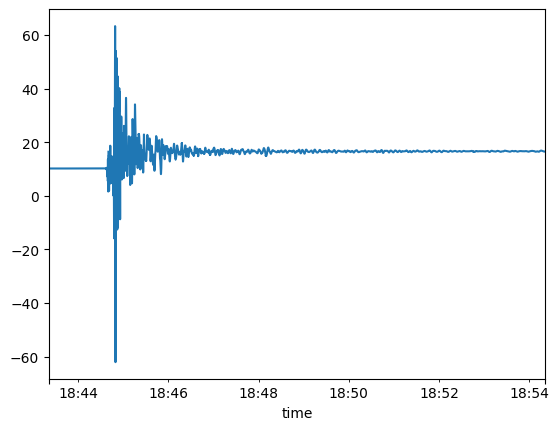

In [56]:
df['CH0 [microstrain]'].plot()

In [51]:
df = pd.concat([strain_raw.data, gauge_microstrain.data, regional_microstrain_tide.data, regional_microstrain_lab.data], axis=1)

In [36]:
merged_df = strain_raw.data.merge(gauge_microstrain.data, how='inner').merge(regional_microstrain_tide.data, how='inner').merge(regional_microstrain_lab.data, how='inner')

MergeError: No common columns to perform merge on. Merge options: left_on=None, right_on=None, left_index=False, right_index=False

In [83]:
gauge_microstrain = strain_raw.linearize(reference_strains=meta.reference_strains, gap=meta.gap)
gauge_microstrain.stats()

gauge_microstrain_interpolated = gauge_microstrain.interpolate(method='linear', limit_seconds=3600)
gauge_microstrain_interpolated.stats()

Converting raw counts to microstrain
    Found 74 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 4.93%
PB.B045.T0.BS*.linearized
    | Channels: ['CH0', 'CH1', 'CH2', 'CH3']             
    | TimeRange: 2024-12-05 18:44:06 - 2024-12-05 18:45:21        | Period:          0.05s
    | Series: microstrain| Units:   microstrain| Level:          1| Gaps:            4.93% 
    | Epochs:        1501| Good:        1426.75| Missing:    74.25| Interpolated:      0.0
    | Samples:       6004| Good:           5707| Missing:      297| Interpolated:        0
Interpolating data using method=linear and limit=72000
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%
PB.B045.T0.BS*.linearized.interpolated
    | Channels: ['CH0', 'CH1', 'CH2', 'CH3']             
    | TimeRange: 2024-12-05 18:44:06 - 2024-12-05 18:45:21        | Period:          0.05s
    | Series: microstrain| Units:   microstrain| Leve

Applying Butterworth Filter
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%
PB.B045.T0.BS*.linearized.interpolated.filtered
    | Channels: ['CH0', 'CH1', 'CH2', 'CH3']             
    | TimeRange: 2024-12-05 18:44:06 - 2024-12-05 18:45:21        | Period:          0.05s
    | Series:            | Units:   microstrain| Level:          1| Gaps:             0.0% 
    | Epochs:        1501| Good:        1426.75| Missing:      0.0| Interpolated:    74.25
    | Samples:       6004| Good:           5707| Missing:        0| Interpolated:      297


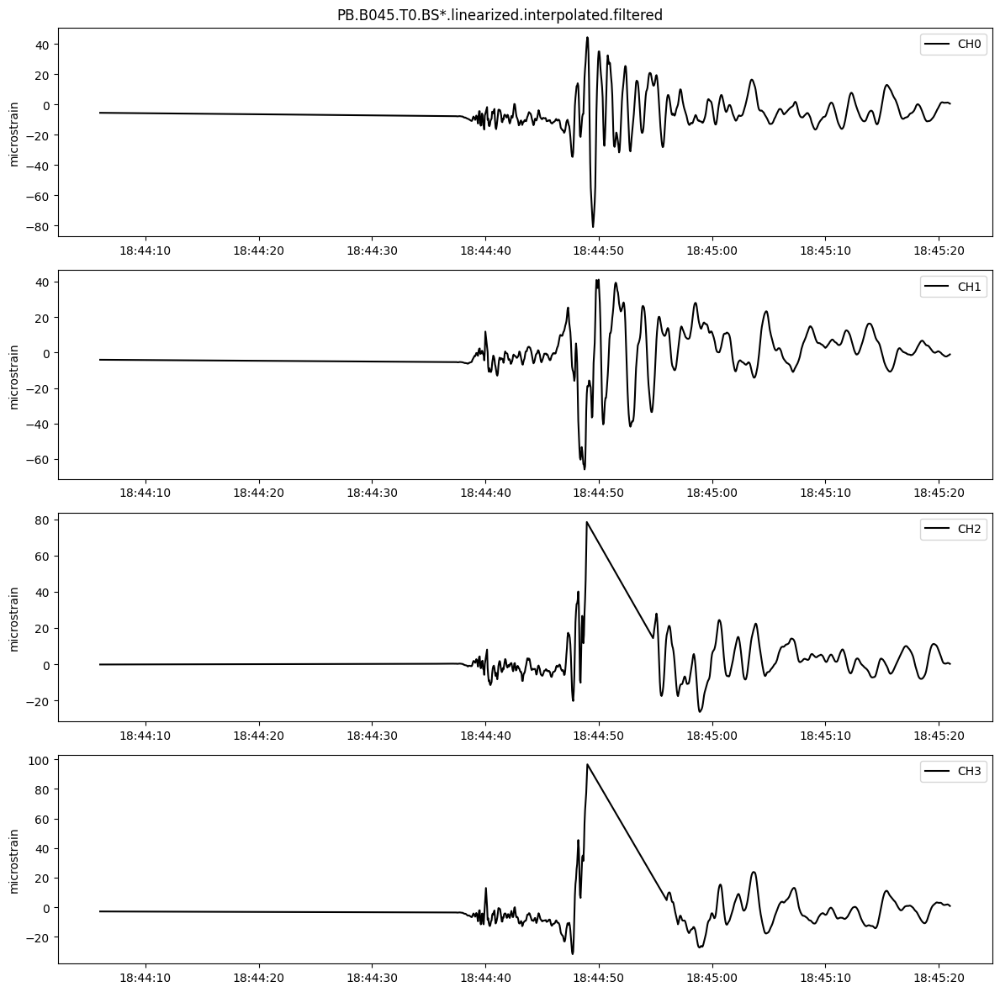

In [84]:
gauge_microstrain_filtered = gauge_microstrain_interpolated.butterworth_filter(filter_type='high', filter_order=2, filter_cutoff_s=1000)
gauge_microstrain_filtered.stats()
gauge_microstrain_filtered.plot(type='line')

Calculating dynamic strain using gauge weights: [1, 1, 1, 1]
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%
PB.B045.T0.BS*.linearized.interpolated.filtered.dynamic
    | Channels: ['dynamic']                              
    | TimeRange: 2024-12-05 18:44:06 - 2024-12-05 18:45:21        | Period:          0.05s
    | Series:     dynamic| Units:   microstrain| Level:          1| Gaps:             0.0% 
    | Epochs:        1501| Good:         1336.0| Missing:      0.0| Interpolated:    165.0
    | Samples:       1501| Good:           1336| Missing:        0| Interpolated:      165


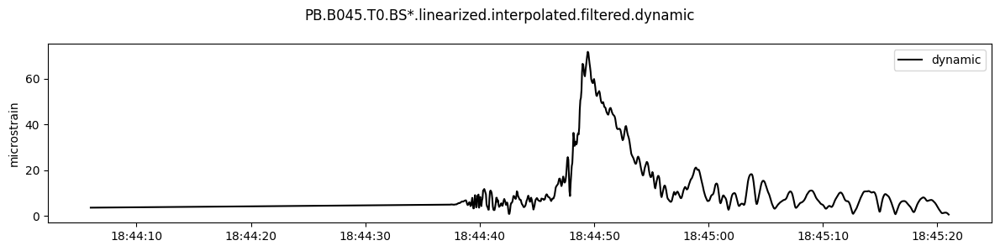

In [85]:
dynamic_strain = gauge_microstrain_filtered.dynamic_strain()
dynamic_strain.stats()
dynamic_strain.plot(type='line')

Calculating magnitude from dynamic strain using site term 0.4207 and longitude term 0
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%


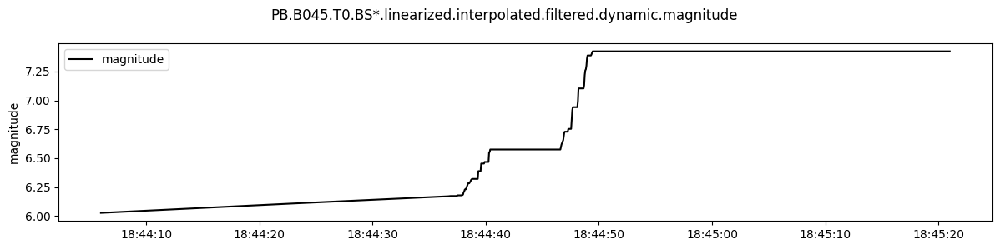

In [86]:
estimated_magnitude = dynamic_strain.calculate_magnitude(hypocentral_distance, meta.site_term, meta.longitude_term)
estimated_magnitude.plot()

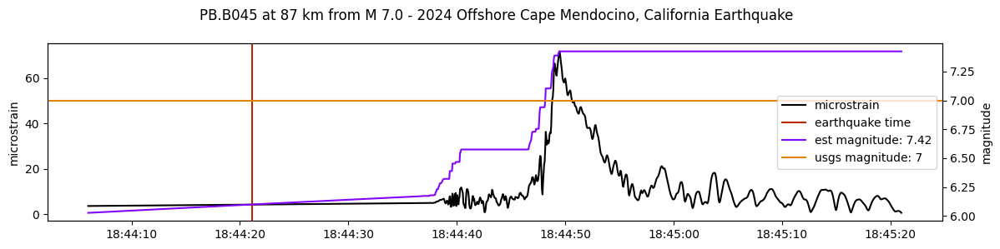

In [87]:
title = f"{network}.{station} at {hypocentral_distance} km from {eq.name}"
magnitude_plot(dynamic_strain_df=dynamic_strain.data,
               magnitude_df=estimated_magnitude.data,
               eq_time=eq.time,
               eq_mag=eq.mag,
               title=title)

Applying None matrix:
 [[-9.57000000e-01 -1.72300000e+00 -5.81000000e-01  1.16000000e-01]
 [ 1.58000000e-01 -3.70000000e-01  8.49196509e-17  3.04000000e-01]
 [ 4.59000000e-01  1.31000000e-01 -4.91000000e-01 -8.40000000e-02]]
    Found 0 epochs with nans, 0.0 epochs with 999999s, and 0 missing epochs.
    Total missing data is 0.0%


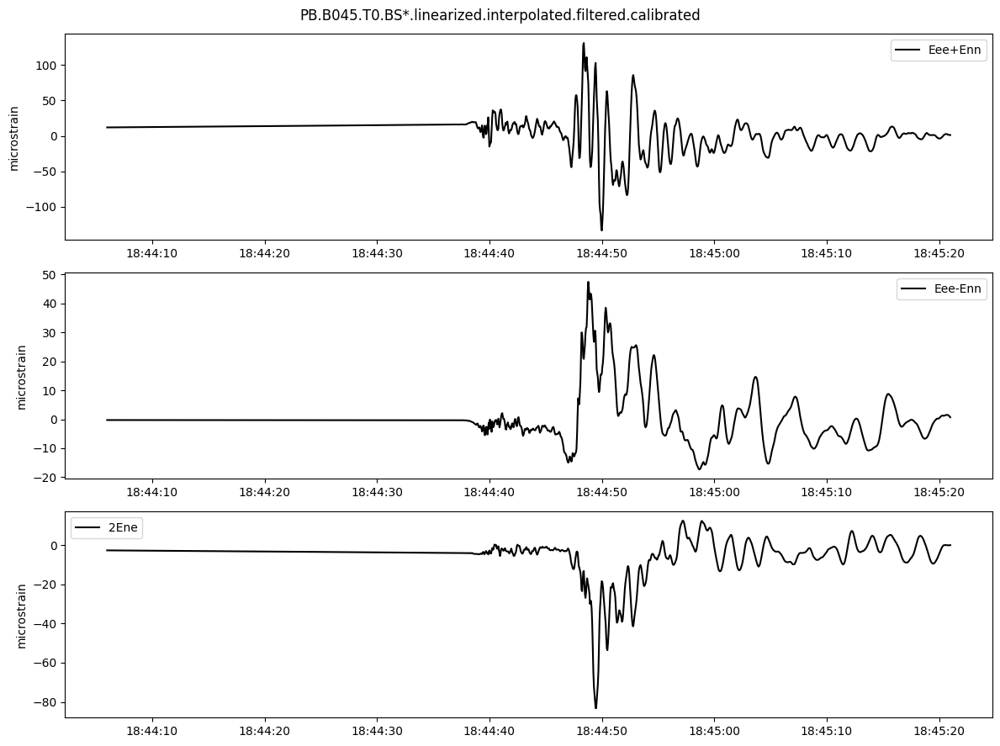

In [96]:
regional_microstrain = gauge_microstrain_filtered.apply_calibration_matrix(meta.strain_matrices['KH2013'])
regional_microstrain.plot()

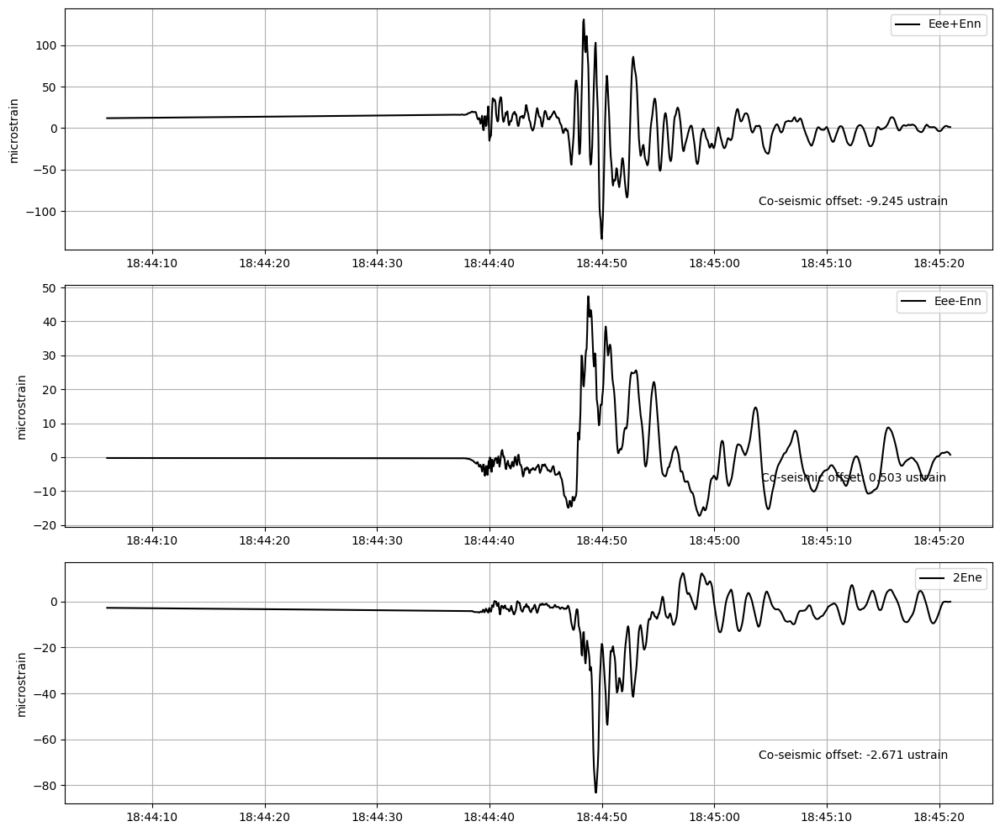

In [97]:
plot_coseismic_offset(
    df = regional_microstrain.data,
    plot_type='line',
    units = 'microstrain',
    eq_time= eq.time,
    coseismic_offset = True,
    color="black",)

In [98]:
from earthscopestraintools.strain_visualization import strain_video

In [99]:
regional_microstrain.data

,Eee+Enn,Eee-Enn,2Ene
time,,,
2024-12-05 18:44:06.000,11.984701,-0.263428,-2.713182
2024-12-05 18:44:06.050,11.990715,-0.263502,-2.715134
2024-12-05 18:44:06.100,11.996699,-0.263579,-2.717049
2024-12-05 18:44:06.150,12.002767,-0.263720,-2.718980
2024-12-05 18:44:06.200,12.009106,-0.263745,-2.721001
...,...,...,...
2024-12-05 18:45:20.800,1.645984,1.427238,-0.129192
2024-12-05 18:45:20.850,1.573074,1.320173,-0.140540
2024-12-05 18:45:20.900,1.523974,1.141603,-0.145141


In [100]:
meta.strain_matrices['KH2013']

array([[-0.957, -1.723, -0.581,  0.116],
       [ 0.158, -0.37 ,  0.   ,  0.304],
       [ 0.459,  0.131, -0.491, -0.084]])

In [101]:
# Calculate Azimuth
from obspy.geodetics import gps2dist_azimuth
dist, az, _ = gps2dist_azimuth(eq.lat,eq.long,meta.latitude,meta.longitude)

In [105]:
regional_microstrain.data['Eee+Enn_org'] = regional_microstrain.data['Eee+Enn']
regional_microstrain.data['Eee+Enn'] = np.ones(len(regional_microstrain.data))

In [108]:
meta.station

'B045'

Animation.save using <class 'matplotlib.animation.PillowWriter'>


Saving Figure: /Users/chanagan/Downloads/B045M7Mendocino20241205.gif


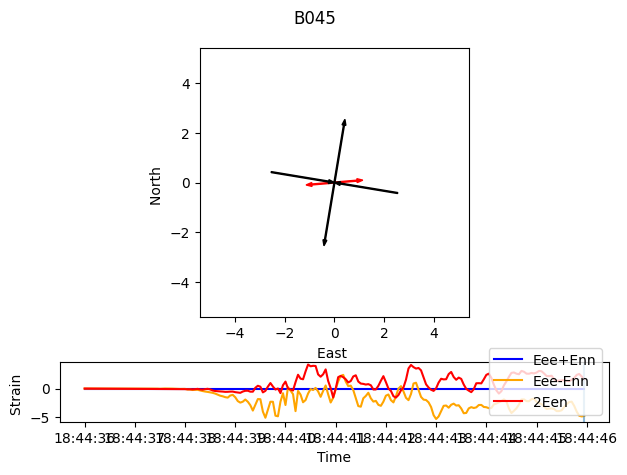

Animation.save using <class 'matplotlib.animation.HTMLWriter'>


In [ ]:
strain_video(regional_microstrain.data,azimuth_arrow=az, start='2024-12-05T18:44:36',end='2024-12-05T18:44:45',skip=1, repeat=True,
             title=meta.station,savegif='/Users/chanagan/Downloads/B045M7Mendocino20241205.gif')


In [112]:
regional_microstrain.data

,Eee+Enn,Eee-Enn,2Ene,Eee+Enn_org
time,,,,
2024-12-05 18:44:06.000,1.0,-0.263428,-2.713182,11.984701
2024-12-05 18:44:06.050,1.0,-0.263502,-2.715134,11.990715
2024-12-05 18:44:06.100,1.0,-0.263579,-2.717049,11.996699
2024-12-05 18:44:06.150,1.0,-0.263720,-2.718980,12.002767
2024-12-05 18:44:06.200,1.0,-0.263745,-2.721001,12.009106
...,...,...,...,...
2024-12-05 18:45:20.800,1.0,1.427238,-0.129192,1.645984
2024-12-05 18:45:20.850,1.0,1.320173,-0.140540,1.573074
2024-12-05 18:45:20.900,1.0,1.141603,-0.145141,1.523974


In [75]:
ea1, ed1, es1 = regional_microstrain.data.iloc[0:100].mean()
ea2, ed2, es2 = regional_microstrain.data.iloc[-100:].mean()
ea, ed, es = ea2-ea1, ed2-ed1, es2-es1
print(ea, ed, es), np.array(ea)

4.198760984994935 -0.8005273148724112 -0.4958703801842871


(None, array(4.19876098))

In [76]:
np.array([ea])

array([4.19876098])

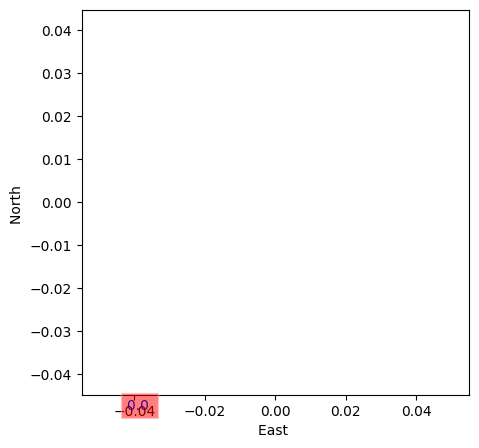

In [78]:
from earthscopestraintools.strain_visualization import map_strain
import numpy as np
# Array of offsets to plot in areal, differential, and shear strains

# Colors for each set of axes
colors = ['lightblue','orange','maroon']
# labeels for each set of arrows
station_list = ['lightblue','orange','maroon']
# call the function
map_strain(areal=np.array([ea])*1000,differential=np.array([ed])*1000,shear=np.array([es])*1000,lats=np.array([35]),lons=np.array([-118]))

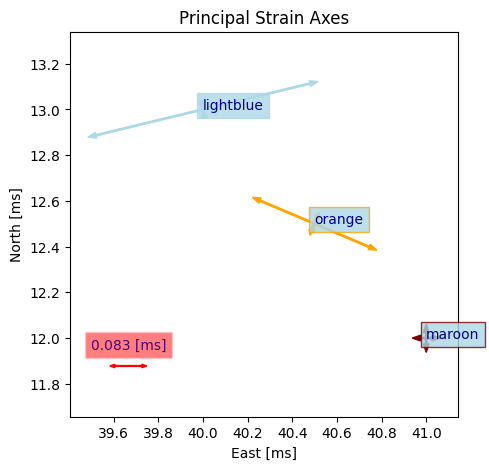

In [72]:
from earthscopestraintools.strain_visualization import map_strain
import numpy as np
# Array of offsets to plot in areal, differential, and shear strains
ea = np.array([1,0.5,0.25])*10
ed = np.array([1,0.5,0])*10
es = np.array([0.5,-0.5,0])*10
# Colors for each set of axes
colors = ['lightblue','orange','maroon']
# labeels for each set of arrows
station_list = ['lightblue','orange','maroon']
# location informtion
lats, lons = np.array([13,12.5,12.0]), np.array([40,40.5,41])
# call the function
map_strain(areal=ea,differential=ed,shear=es,
           lats=lats, lons=lons,station_list=station_list,
           colors=colors,units='ms',title='Principal Strain Axes')